In [1]:
import os
import pandas as pd
import numpy as np
from tqdm import tqdm
import ast
import time
import matplotlib.pyplot as plt
from matplotlib.image import imread
import matplotlib.lines as mlines
import glob
import matplotlib.patches as patches

In [2]:
from Utils import normalized_distance_from_center

# Step 11

investigate the road users on road and pavements.

decide wether it is needed to add a binary feature for on/off pavement or zebra crossing.

## Load dfs from 02_fps_degraded_data 

In [3]:
# Specify the directory to load files from
directory = r'C:\Users\yftac\Documents\00_Project_Afeka\ttc_calculation\02_fps_degraded_data'
# Get a list of files in the directory
file_name_list = os.listdir(directory)
file_name_list

['18_fps_degraded_data.csv',
 '19_fps_degraded_data.csv',
 '20_fps_degraded_data.csv',
 '21_fps_degraded_data.csv',
 '22_fps_degraded_data.csv',
 '23_fps_degraded_data.csv',
 '24_fps_degraded_data.csv',
 '25_fps_degraded_data.csv',
 '26_fps_degraded_data.csv',
 '27_fps_degraded_data.csv',
 '28_fps_degraded_data.csv',
 '29_fps_degraded_data.csv']

In [4]:
recordingId_list = file_name_list.copy()
for i in range(len(recordingId_list)):
    recordingId_list[i]=recordingId_list[i].replace('_fps_degraded_data.csv', '')
recordingId_list

['18', '19', '20', '21', '22', '23', '24', '25', '26', '27', '28', '29']

In [5]:
root_dir = r"C:\Users\yftac\Documents\00_Project_Afeka\ttc_calculation"

In [6]:
def load_dfs(file_name_list, root_dir, folder_name):
    os.chdir(root_dir)
    # change to data dir
    os.chdir(folder_name)
    dfs = []
    for i in range(len(file_name_list)):
        df=pd.read_csv(file_name_list[i])
        dfs.append(df)
    # change back to parent directory
    os.chdir('..')
    return dfs
dfs = load_dfs(file_name_list, root_dir, directory)

In [7]:
#create folder to save plots
os.chdir(root_dir)
folder_name_ttc='11_investigate_tracks_plots'
if not os.path.exists(folder_name_ttc):
    os.makedirs(folder_name_ttc)
    print('folder created')
else:
    print('folder already exists')

folder already exists


### Get the orthoPxToMeter for each recording

In [8]:
# load metadata files
all_files = glob.glob(r'C:\Users\yftac\Documents\00_Project_Afeka\inD\drone-dataset-tools-master\data\*.csv')
recordingMeta_files_list = [f for f in all_files if 'recordingMeta' in f]
# open recordingMeta files and sort by location and then extract recordingId
def get_metadata_orthoPxToMeter(files, column_name, search_string):
    matching_files = []
    orthoPxToMeter_list = []
    for file in files:
        df = pd.read_csv(file)
        if search_string in df[column_name].values:
            matching_files.append(file)
            #read file to df
    for file in matching_files:        
        df = pd.read_csv(file)
        orthoPxToMeter_list.append(df['orthoPxToMeter'].values[0])
    return orthoPxToMeter_list

chosen_location=2
orthoPxToMeter_list=get_metadata_orthoPxToMeter(recordingMeta_files_list, 'locationId', chosen_location)
print(len(orthoPxToMeter_list))
print(orthoPxToMeter_list)

12
[0.00814636091724502, 0.00814636091724502, 0.00814636091724502, 0.00814636091724502, 0.00814636091724502, 0.00814636091724502, 0.00814636091724502, 0.00814636091724502, 0.00814636091724502, 0.00814636091724502, 0.00814636091724502, 0.00814636091724502]


### Get the location image list by recordingId

In [9]:
image_directory = r'C:\Users\yftac\Documents\00_Project_Afeka\inD\drone-dataset-tools-master\data'
# recordingId_list # list of recording 
# Get a list of image paths that match recordingId
image_paths = []
for recording_id in recordingId_list:
    for file in os.listdir(image_directory):
        if file.endswith('.png'): # get list of png images with relevant id's
            if recording_id in file:
                image_paths.append(os.path.join(image_directory, file))
    # Print the list of matching image paths
image_paths

['C:\\Users\\yftac\\Documents\\00_Project_Afeka\\inD\\drone-dataset-tools-master\\data\\18_background.png',
 'C:\\Users\\yftac\\Documents\\00_Project_Afeka\\inD\\drone-dataset-tools-master\\data\\19_background.png',
 'C:\\Users\\yftac\\Documents\\00_Project_Afeka\\inD\\drone-dataset-tools-master\\data\\20_background.png',
 'C:\\Users\\yftac\\Documents\\00_Project_Afeka\\inD\\drone-dataset-tools-master\\data\\21_background.png',
 'C:\\Users\\yftac\\Documents\\00_Project_Afeka\\inD\\drone-dataset-tools-master\\data\\22_background.png',
 'C:\\Users\\yftac\\Documents\\00_Project_Afeka\\inD\\drone-dataset-tools-master\\data\\23_background.png',
 'C:\\Users\\yftac\\Documents\\00_Project_Afeka\\inD\\drone-dataset-tools-master\\data\\24_background.png',
 'C:\\Users\\yftac\\Documents\\00_Project_Afeka\\inD\\drone-dataset-tools-master\\data\\25_background.png',
 'C:\\Users\\yftac\\Documents\\00_Project_Afeka\\inD\\drone-dataset-tools-master\\data\\26_background.png',
 'C:\\Users\\yftac\\Document

## Plot all object positions on map

In [10]:
scale_down_factor = 12

In [11]:
def plot_objects_on_aerial_image(df, background_image, orthoPxToMeter, scale_down_factor, zoom_in_act, recordingId, active_classes, folder_name_ttc):
    ### prepare x-y coordinates data
    rows_pedestrian = df[df['class'] == 'pedestrian']
    car_rows = df[df['class'] == 'car']
    bicycle_rows = df[df['class'] == 'bicycle']
    truck_bus_rows = df[df['class'] == 'truck_bus']
    # pedestrian
    xCenter_pedestrian_px = (rows_pedestrian['xCenter'] / orthoPxToMeter) / scale_down_factor
    yCenter_pedestrian_px = (rows_pedestrian['yCenter'] / orthoPxToMeter) / scale_down_factor
    # car
    xCenter_car_px =        (car_rows['xCenter'] / orthoPxToMeter) / scale_down_factor
    yCenter_car_px =        (car_rows['yCenter'] / orthoPxToMeter) / scale_down_factor
    # bicycle    
    xCenter_bicycle_px =    (bicycle_rows['xCenter'] / orthoPxToMeter) / scale_down_factor
    yCenter_bicycle_px =    (bicycle_rows['yCenter'] / orthoPxToMeter) / scale_down_factor
    # truck_bus
    xCenter_truck_bus_px =  (truck_bus_rows['xCenter'] / orthoPxToMeter) / scale_down_factor
    yCenter_truck_bus_px =  (truck_bus_rows['yCenter'] / orthoPxToMeter) / scale_down_factor
    # load image data and shape
    image_height_px, image_width_px = background_image.shape[:2]
    height_width_ratio = image_height_px / image_width_px
    #set axis limits
    x_lim_0 = 0 ;                       x_lim_1 = image_width_px  #
    y_lim_0 = image_height_px ;         y_lim_1 = 0 
    # set figure size and image extent
    plt.figure(figsize=(image_width_px/100, image_height_px/100))  # this is only the figure size on the screen
    extent = [0, x_lim_1,  -y_lim_0,  y_lim_1] #  limit the image size only on the figure
    plt.imshow(background_image, extent= extent,  aspect='auto') 
    
    #plot data
    if "pedestrian" in active_classes:
        plt.scatter(xCenter_pedestrian_px, yCenter_pedestrian_px, c='orange', s=0.5, alpha=0.8, label='pedestrian')
    if "car" in active_classes:
        plt.scatter(xCenter_car_px, yCenter_car_px, c='lightskyblue', s=1, alpha=0.8, label='car')
    if "bicycle" in active_classes:
        plt.scatter(xCenter_bicycle_px, yCenter_bicycle_px, c='pink', s=1, alpha=0.8, label='bicycle')
    if "truck_bus" in active_classes:
        plt.scatter(xCenter_truck_bus_px, yCenter_truck_bus_px, c='limegreen', s=2, alpha=0.8, label='truck_bus')
       
    # plot intersting points
    z_crossing_xy_meters = [61.5, -28.1]  
    plt.scatter([(z_crossing_xy_meters[0]/orthoPxToMeter)/scale_down_factor], [(z_crossing_xy_meters[1]/orthoPxToMeter)/scale_down_factor],label=f'zebra crossing [{z_crossing_xy_meters[0]}m,{z_crossing_xy_meters[1]}m]', color='yellow', s=100)
    #Zoom in
    if zoom_in_act == True:
        zoom_x_min = 95  # Minimum x-coordinate for zoom
        delta_x=890
        delta_y = delta_x * height_width_ratio 
        zoom_x_max = zoom_x_min + delta_x # Maximum x-coordinate for zoom
        zoom_y_min = -620  # Minimum y-coordinate for zoom
        zoom_y_max = delta_y + zoom_y_min  # Maximum y-coordinate for zoom
        # Set axis limits to zoom in
        plt.xlim(zoom_x_min, zoom_x_max)
        plt.ylim(zoom_y_min, zoom_y_max)
    # title, labels and legend
    plt.xlabel('X [px]', fontsize=14)
    plt.ylabel('Y [px]', fontsize=14)
    plt.title(f'Coordinates of Classes: {active_classes}'+f'\n RecordingId {recordingId}',fontsize=16)
    
    # legend
    legend_elements = [
        mlines.Line2D([], [], color='orange', marker='o', linestyle='None',         markersize=8, label='pedestrian'),
        mlines.Line2D([], [], color='lightskyblue', marker='o', linestyle='None',   markersize=8, label='car'),
        mlines.Line2D([], [], color='pink', marker='o', linestyle='None',           markersize=8, label='bicycle'),
        mlines.Line2D([], [], color='limegreen', marker='o', linestyle='None',      markersize=8, label='truck_bus'),
        mlines.Line2D([], [], color='yellow', marker='o', linestyle='None',         markersize=8, label='zebra crossing')
    ]
    
    plt.legend(handles=legend_elements, fontsize=12)
    # plt.legend(fontsize=12, scatterpoints=3, markerscale=4)
    #save png
    plt.savefig(f'{root_dir}\\{folder_name_ttc}\\{recordingId}_map.png', dpi=300, bbox_inches='tight', facecolor='white')
    plt.show()
    return

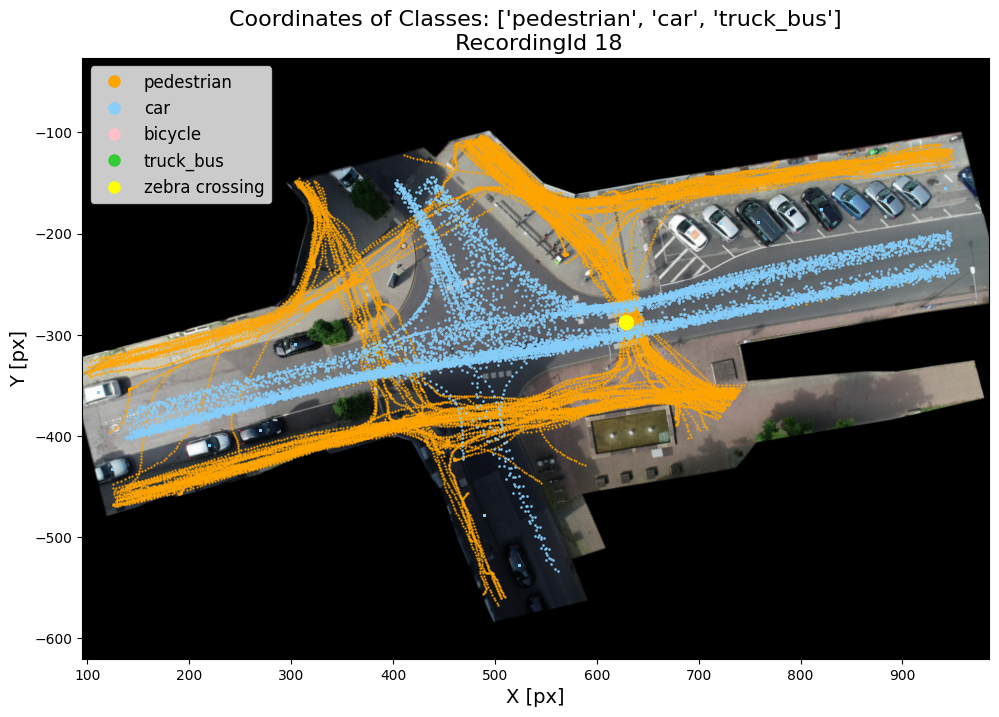

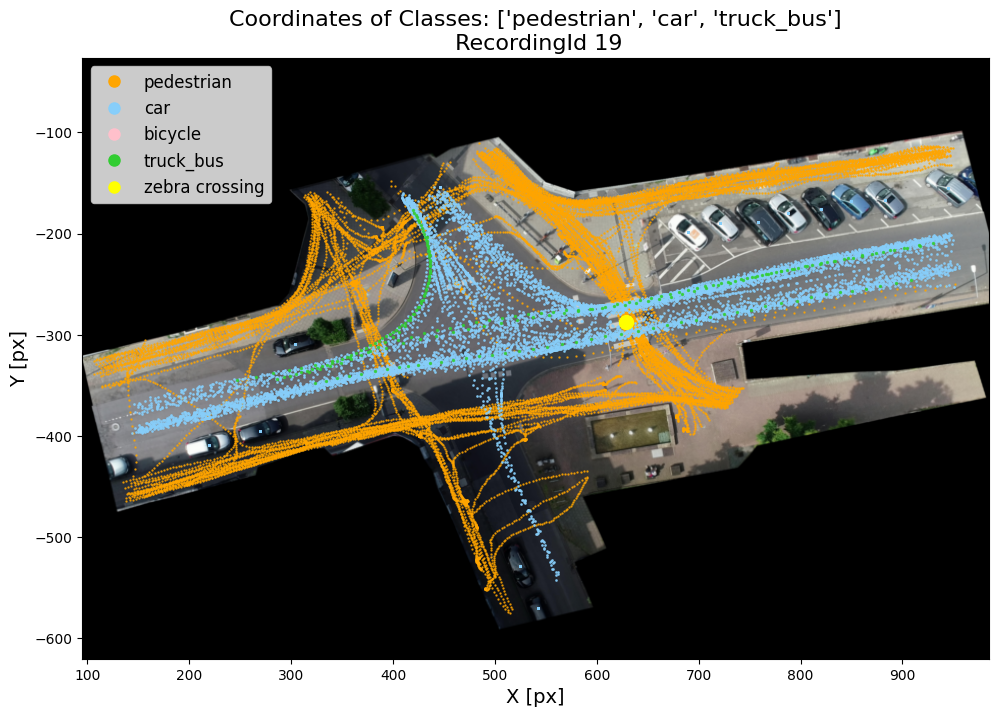

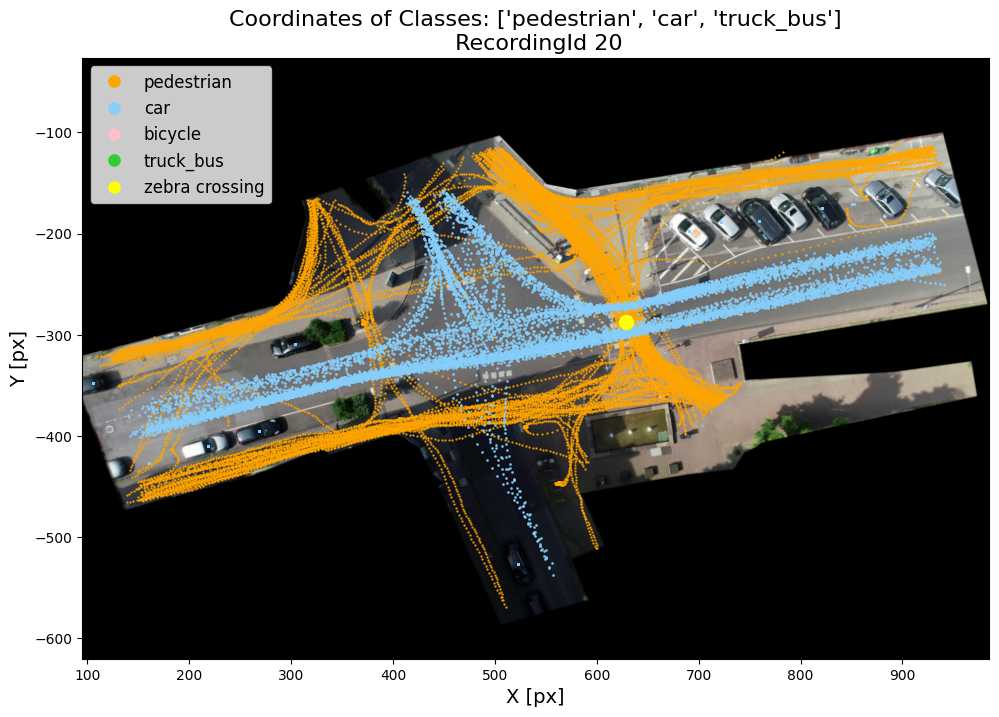

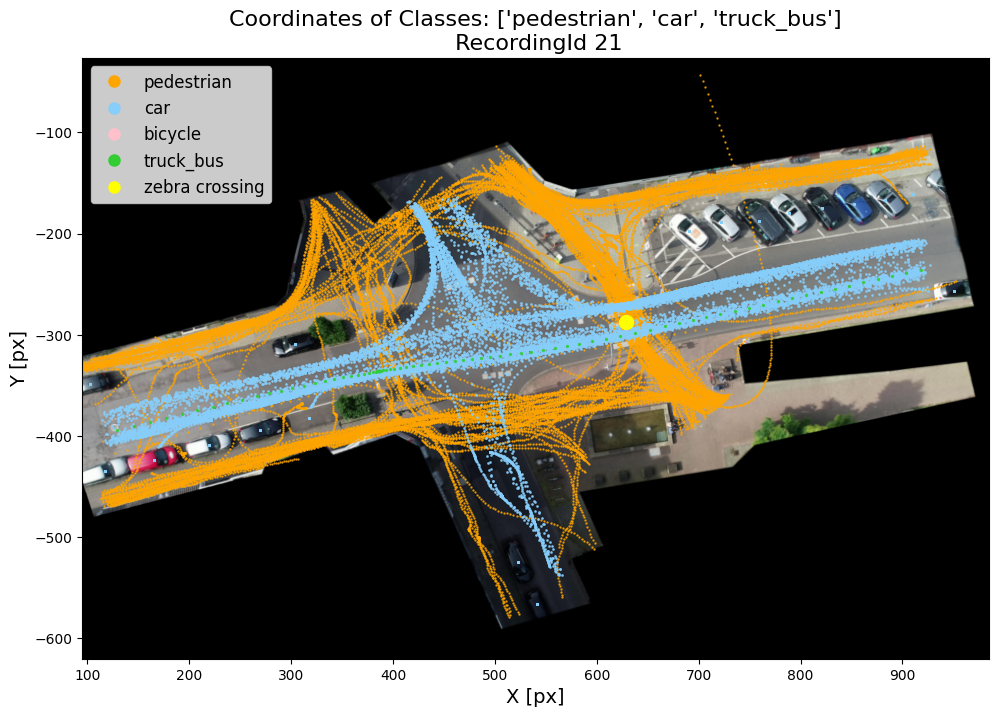

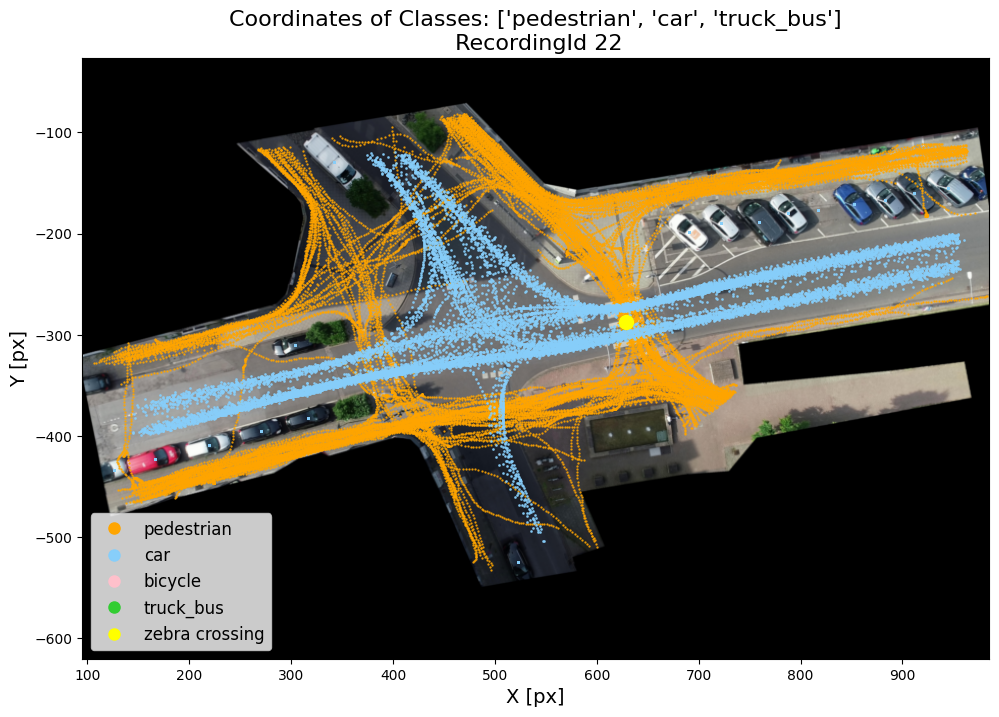

...

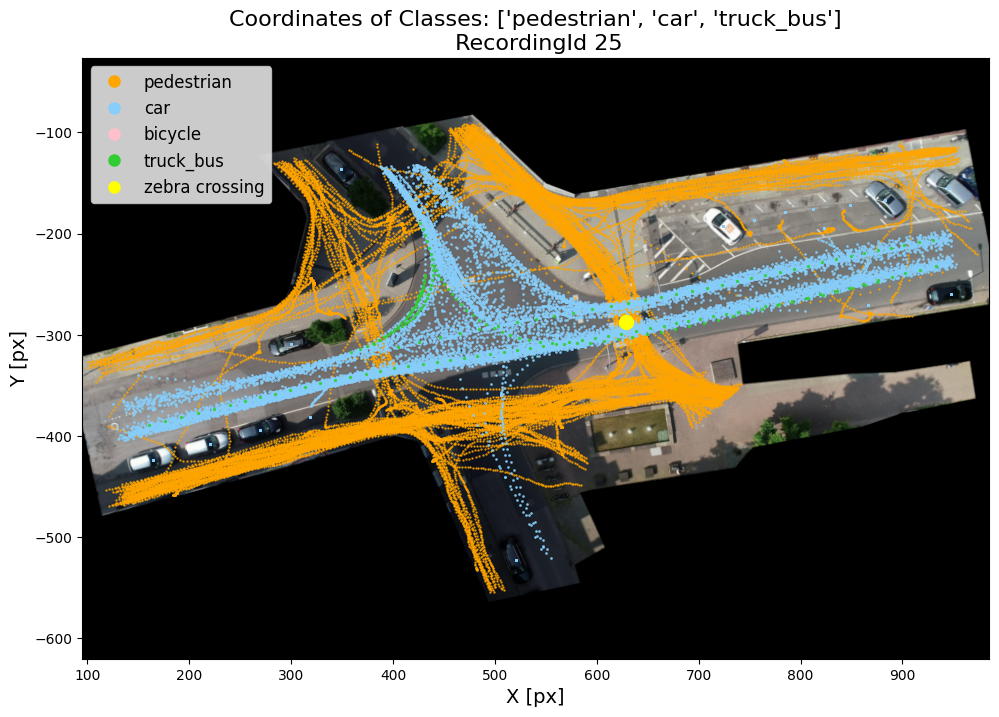

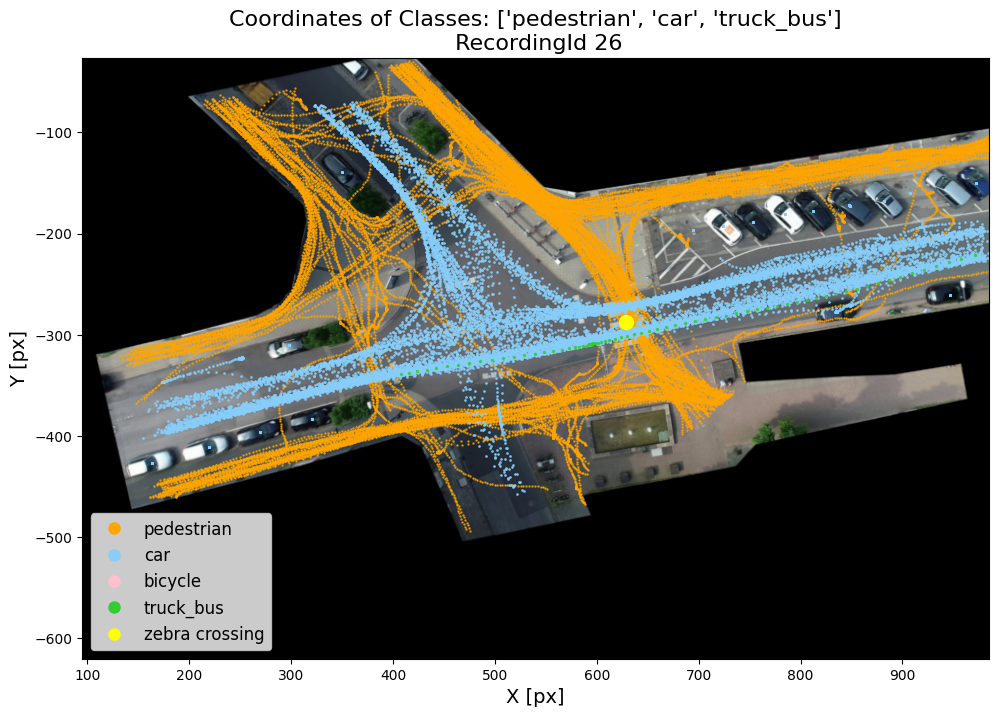

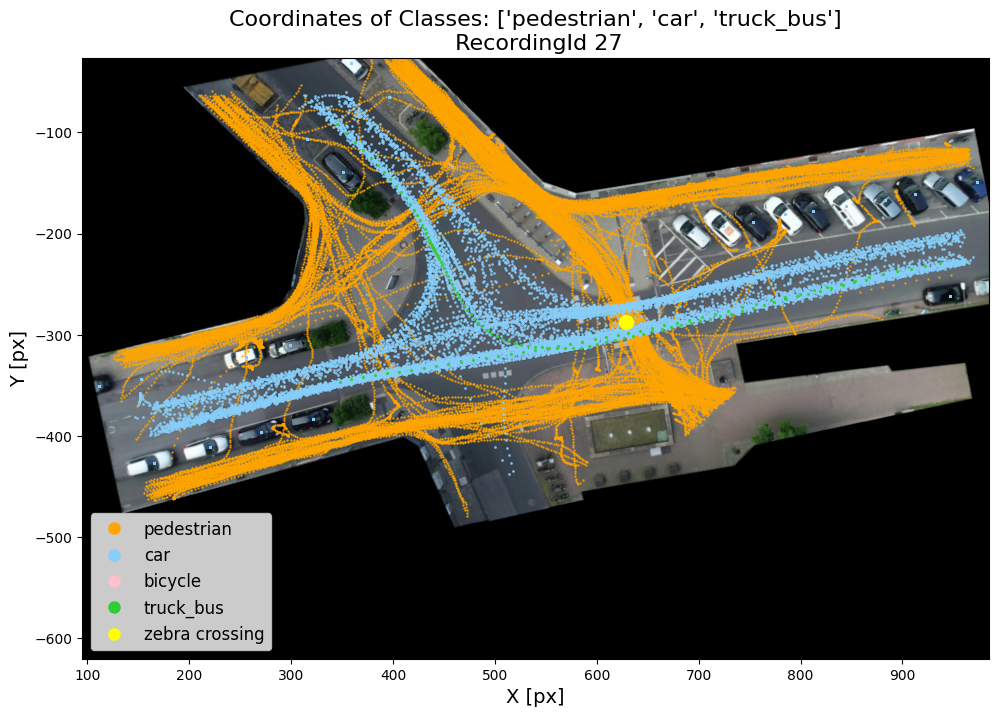

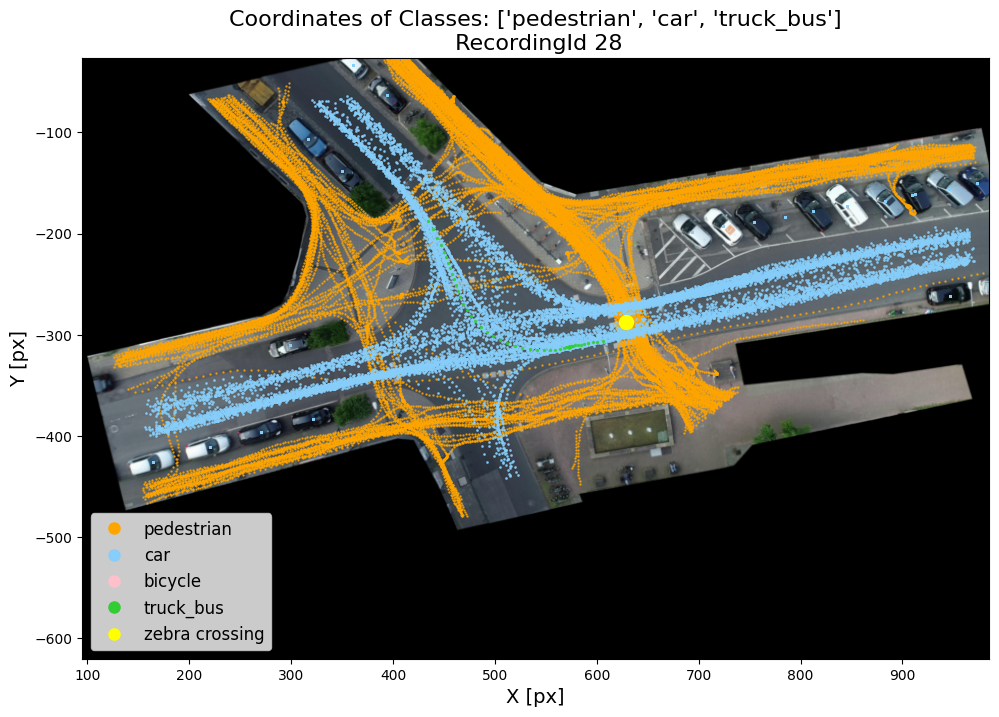

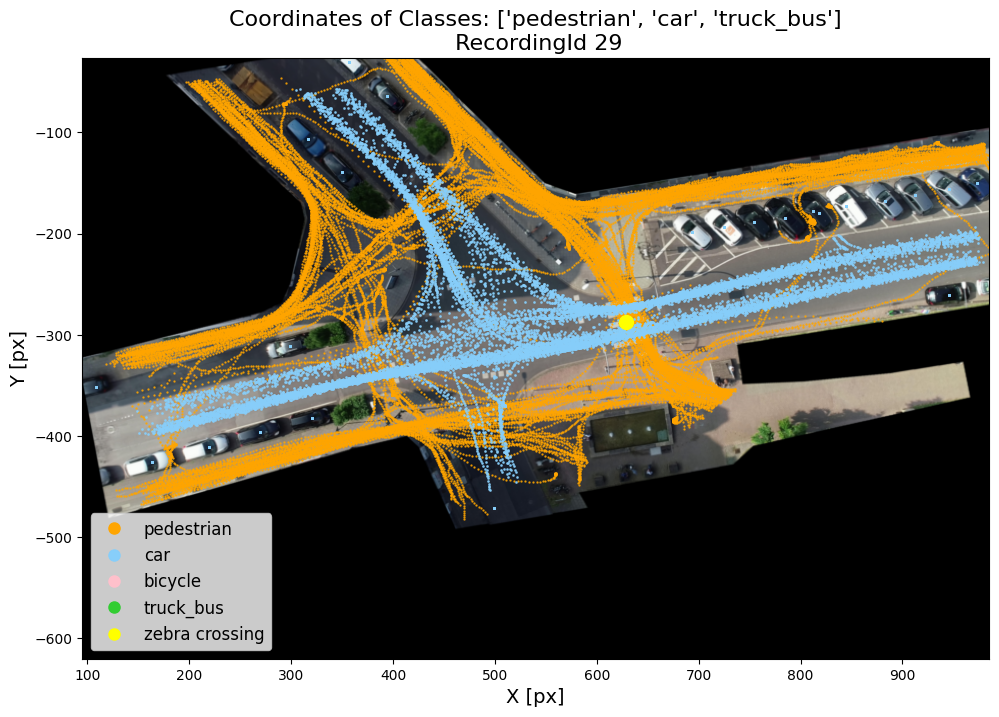

In [12]:
active_classes=["pedestrian", "car",  "truck_bus"]#, "bicycle"]
for x in range(len(dfs)):
    background_image=imread(image_paths[x])
    plot_objects_on_aerial_image(dfs[x], background_image, orthoPxToMeter_list[x], scale_down_factor, True, recordingId_list[x], active_classes, folder_name_ttc)

## Find positions of crossing areas

In [13]:
def convert_to_px(list_xy, orthoPxToMeter, scale_down_factor):
    x, y = list_xy
    x_px = (x / orthoPxToMeter) / scale_down_factor # x in meters
    y_px = (y / orthoPxToMeter) / scale_down_factor # y in meters
    return x_px, y_px

# radius is in px !!!
def draw_circle(x_px, y_px, radius, color='red', alpha=0.5):
    circle = patches.Circle([x_px, y_px], 
                            radius=radius, linewidth=1, edgecolor=color, facecolor='none')
    plt.gca().add_patch(circle)

convert radius from px to m

In [14]:
# convert radius in px to meters
def convert_radius_to_meters(radius_px, orthoPxToMeter, scale_down_factor):
    radius_m = radius_px * orthoPxToMeter * scale_down_factor
    return float(f"{radius_m:.2f}")  # round to 2 decimal places

define function to plot on image:

In [15]:
def plot_specific_points(df, background_image, orthoPxToMeter, scale_down_factor, zoom_in_act, recordingId, folder_name_ttc, xy_1,r1, xy_2,r2, xy_3,r3, r_zebra):
    # load image data and shape
    image_height_px, image_width_px = background_image.shape[:2]
    height_width_ratio = image_height_px / image_width_px
    #set axis limits
    x_lim_0 = 0 ;                       x_lim_1 = image_width_px  #
    y_lim_0 = image_height_px ;         y_lim_1 = 0 
    # set figure size and image extent
    plt.figure(figsize=(image_width_px/150, image_height_px/150))  # this is only the figure size on the screen
    extent = [0, x_lim_1,  -y_lim_0,  y_lim_1] #  limit the image size only on the figure
    plt.imshow(background_image, extent= extent,  aspect='auto') 
    # plot intersting points
        #zebra crossing
    z_crossing_xy_meters = [61.5, -28.1]  
    plt.scatter([(z_crossing_xy_meters[0]/orthoPxToMeter)/scale_down_factor], 
                [(z_crossing_xy_meters[1]/orthoPxToMeter)/scale_down_factor],
                label=f'zebra crossing [{z_crossing_xy_meters[0]}m,{z_crossing_xy_meters[1]}m], R={convert_radius_to_meters(r_zebra, orthoPxToMeter, scale_down_factor)}', 
                color='yellow', s=100)
    x_px, y_px = convert_to_px(z_crossing_xy_meters, orthoPxToMeter, scale_down_factor)
    draw_circle(x_px, y_px, 
                radius=r_zebra, color='yellow', alpha=0.5)
    # xy1
    plt.scatter([(xy_1[0]/orthoPxToMeter)/scale_down_factor], 
                [(xy_1[1]/orthoPxToMeter)/scale_down_factor],
                label=f'zone 1 [{xy_1[0]}m,{xy_1[1]}m],            R={convert_radius_to_meters(r1, orthoPxToMeter, scale_down_factor)}', 
                color='red', s=100)
    x_px, y_px = convert_to_px(xy_1, orthoPxToMeter, scale_down_factor)
    draw_circle(x_px, y_px, 
                radius=r1, color='red', alpha=0.5)
    # xy2
    plt.scatter([(xy_2[0]/orthoPxToMeter)/scale_down_factor], 
            [(xy_2[1]/orthoPxToMeter)/scale_down_factor],
            label=f'zone 2 [{xy_2[0]}m,{xy_2[1]}m],            R={convert_radius_to_meters(r2, orthoPxToMeter, scale_down_factor)}', 
            color='green', s=100)
    x_px, y_px = convert_to_px(xy_2, orthoPxToMeter, scale_down_factor)
    draw_circle(x_px, y_px, 
                radius=r2, color='green', alpha=0.5)
    # xy3
    plt.scatter([(xy_3[0]/orthoPxToMeter)/scale_down_factor], 
                [(xy_3[1]/orthoPxToMeter)/scale_down_factor],
                label=f'zone 3 [{xy_3[0]}m,{xy_3[1]}m],         R={convert_radius_to_meters(r3, orthoPxToMeter, scale_down_factor)}', 
                color='blue', s=100)
    x_px, y_px = convert_to_px(xy_3, orthoPxToMeter, scale_down_factor)
    draw_circle(x_px, y_px, 
                radius=r3, color='blue', alpha=0.5)
    #Zoom in
    if zoom_in_act == True:
        zoom_x_min = 95  # Minimum x-coordinate for zoom
        delta_x=890
        delta_y = delta_x * height_width_ratio 
        zoom_x_max = zoom_x_min + delta_x # Maximum x-coordinate for zoom
        zoom_y_min = -620  # Minimum y-coordinate for zoom
        zoom_y_max = delta_y + zoom_y_min  # Maximum y-coordinate for zoom
        # Set axis limits to zoom in
        plt.xlim(zoom_x_min, zoom_x_max)
        plt.ylim(zoom_y_min, zoom_y_max)
    # title, labels and legend
    plt.xlabel('X [px]', fontsize=14)
    plt.ylabel('Y [px]', fontsize=14)
    plt.title(f'Coordinates of Classes: {active_classes}'+f'\n RecordingId {recordingId}',fontsize=16)
    
    plt.legend()
    plt.show()
    return

In [16]:
def plot_objects_on_aerial_image_with_circles(df, background_image, orthoPxToMeter, scale_down_factor, zoom_in_act, recordingId, active_classes, folder_name_ttc, xy_1,r1, xy_2,r2, xy_3,r3, r_zebra):
    ### prepare x-y coordinates data
    rows_pedestrian = df[df['class'] == 'pedestrian']
    car_rows = df[df['class'] == 'car']
    bicycle_rows = df[df['class'] == 'bicycle']
    truck_bus_rows = df[df['class'] == 'truck_bus']
    # pedestrian
    xCenter_pedestrian_px = (rows_pedestrian['xCenter'] / orthoPxToMeter) / scale_down_factor
    yCenter_pedestrian_px = (rows_pedestrian['yCenter'] / orthoPxToMeter) / scale_down_factor
    # car
    xCenter_car_px =        (car_rows['xCenter'] / orthoPxToMeter) / scale_down_factor
    yCenter_car_px =        (car_rows['yCenter'] / orthoPxToMeter) / scale_down_factor
    # bicycle    
    xCenter_bicycle_px =    (bicycle_rows['xCenter'] / orthoPxToMeter) / scale_down_factor
    yCenter_bicycle_px =    (bicycle_rows['yCenter'] / orthoPxToMeter) / scale_down_factor
    # truck_bus
    xCenter_truck_bus_px =  (truck_bus_rows['xCenter'] / orthoPxToMeter) / scale_down_factor
    yCenter_truck_bus_px =  (truck_bus_rows['yCenter'] / orthoPxToMeter) / scale_down_factor
    # load image data and shape
    image_height_px, image_width_px = background_image.shape[:2]
    height_width_ratio = image_height_px / image_width_px
    #set axis limits
    x_lim_0 = 0 ;                       x_lim_1 = image_width_px  #
    y_lim_0 = image_height_px ;         y_lim_1 = 0 
    # set figure size and image extent
    plt.figure(figsize=(image_width_px/100, image_height_px/100))  # this is only the figure size on the screen
    extent = [0, x_lim_1,  -y_lim_0,  y_lim_1] #  limit the image size only on the figure
    plt.imshow(background_image, extent= extent,  aspect='auto') 
    
    #plot data
    if "pedestrian" in active_classes:
        plt.scatter(xCenter_pedestrian_px, yCenter_pedestrian_px, c='orange', s=0.5, alpha=0.8, label='pedestrian')
    if "car" in active_classes:
        plt.scatter(xCenter_car_px, yCenter_car_px, c='lightskyblue', s=1, alpha=0.8, label='car')
    if "bicycle" in active_classes:
        plt.scatter(xCenter_bicycle_px, yCenter_bicycle_px, c='pink', s=1, alpha=0.8, label='bicycle')
    if "truck_bus" in active_classes:
        plt.scatter(xCenter_truck_bus_px, yCenter_truck_bus_px, c='limegreen', s=2, alpha=0.8, label='truck_bus')
       
    # plot intersting points
    z_crossing_xy_meters = [61.5, -28.1] 
    label_zebra=f'zebra crossing [{z_crossing_xy_meters[0]}m,{z_crossing_xy_meters[1]}m], R={convert_radius_to_meters(r_zebra, orthoPxToMeter, scale_down_factor)}' 
    plt.scatter([(z_crossing_xy_meters[0]/orthoPxToMeter)/scale_down_factor], 
                [(z_crossing_xy_meters[1]/orthoPxToMeter)/scale_down_factor],
                label=label_zebra, 
                color='yellow', s=100)
    x_px, y_px = convert_to_px(z_crossing_xy_meters, orthoPxToMeter, scale_down_factor)
    draw_circle(x_px, y_px, 
                radius=r_zebra, color='yellow', alpha=0.5)
    # xy1
    label_1=f'zone 1 [{xy_1[0]}m,{xy_1[1]}m], R={convert_radius_to_meters(r1, orthoPxToMeter, scale_down_factor)}'
    plt.scatter([(xy_1[0]/orthoPxToMeter)/scale_down_factor], 
                [(xy_1[1]/orthoPxToMeter)/scale_down_factor],
                label=label_1, 
                color='red', s=100)
    x_px, y_px = convert_to_px(xy_1, orthoPxToMeter, scale_down_factor)
    draw_circle(x_px, y_px, 
                radius=r1, color='red', alpha=0.5)
    # xy2
    label_2=f'zone 2 [{xy_2[0]}m,{xy_2[1]}m], R={convert_radius_to_meters(r2, orthoPxToMeter, scale_down_factor)}'
    plt.scatter([(xy_2[0]/orthoPxToMeter)/scale_down_factor], 
            [(xy_2[1]/orthoPxToMeter)/scale_down_factor],
            label=label_2, 
            color='green', s=100)
    x_px, y_px = convert_to_px(xy_2, orthoPxToMeter, scale_down_factor)
    draw_circle(x_px, y_px, 
                radius=r2, color='green', alpha=0.5)
    # xy3
    label_3=f'zone 3 [{xy_3[0]}m,{xy_3[1]}m], R={convert_radius_to_meters(r3, orthoPxToMeter, scale_down_factor)}'
    plt.scatter([(xy_3[0]/orthoPxToMeter)/scale_down_factor], 
                [(xy_3[1]/orthoPxToMeter)/scale_down_factor],
                label=label_3, 
                color='blue', s=100)
    x_px, y_px = convert_to_px(xy_3, orthoPxToMeter, scale_down_factor)
    draw_circle(x_px, y_px, 
                radius=r3, color='blue', alpha=0.5)
    
    #Zoom in
    if zoom_in_act == True:
        zoom_x_min = 95  # Minimum x-coordinate for zoom
        delta_x=890
        delta_y = delta_x * height_width_ratio 
        zoom_x_max = zoom_x_min + delta_x # Maximum x-coordinate for zoom
        zoom_y_min = -620  # Minimum y-coordinate for zoom
        zoom_y_max = delta_y + zoom_y_min  # Maximum y-coordinate for zoom
        # Set axis limits to zoom in
        plt.xlim(zoom_x_min, zoom_x_max)
        plt.ylim(zoom_y_min, zoom_y_max)
    # title, labels and legend
    plt.xlabel('X [px]', fontsize=14)
    plt.ylabel('Y [px]', fontsize=14)
    plt.title(f'Coordinates of Classes: {active_classes}'+f'\n RecordingId {recordingId}',fontsize=16)
    
    # legend
    legend_elements = [
        mlines.Line2D([], [], color='orange', marker='o', linestyle='None',         markersize=7, label='pedestrian'),
        mlines.Line2D([], [], color='lightskyblue', marker='o', linestyle='None',   markersize=7, label='car'),
        mlines.Line2D([], [], color='pink', marker='o', linestyle='None',           markersize=7, label='bicycle'),
        mlines.Line2D([], [], color='limegreen', marker='o', linestyle='None',      markersize=7, label='truck_bus'),
        mlines.Line2D([], [], color='yellow', marker='o', linestyle='None',         markersize=7, label=label_zebra),
        mlines.Line2D([], [], color='red', marker='o', linestyle='None',            markersize=7, label=label_1),
        mlines.Line2D([], [], color='green', marker='o', linestyle='None',          markersize=7, label=label_2),
        mlines.Line2D([], [], color='blue', marker='o', linestyle='None',           markersize=7, label=label_3)
    ]
    
    plt.legend(handles=legend_elements, fontsize=10)
    # plt.legend(fontsize=12, scatterpoints=3, markerscale=4)
    #save png
    plt.savefig(f'{root_dir}\\{folder_name_ttc}\\{recordingId}_map_with_crossing_region_circles.png', dpi=300, bbox_inches='tight', facecolor='white')
    plt.show()
    return

define the regions centers and radius

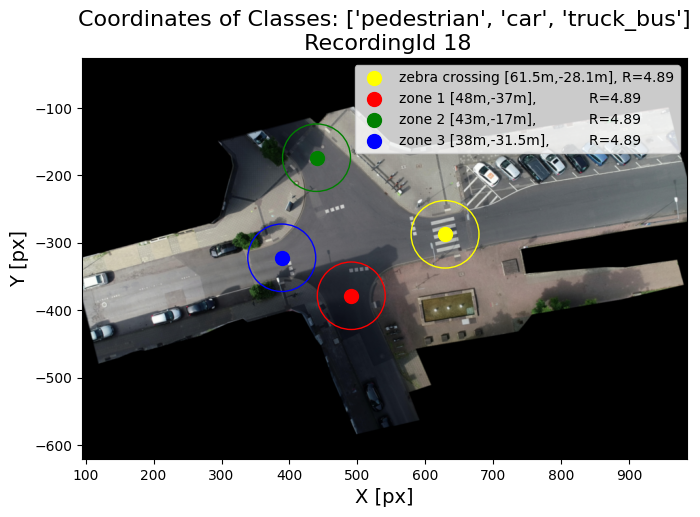

In [17]:
xy_1 = [48, -37]  # zone a    center [m]
r1= 50             # [px]
xy_2 = [43, -17]    # zone b    center [m]
r2= 50             # [px]
xy_3 = [38, -31.5]  # zone c    center [m]
r3= 50            # [px]
r_zebra= 50         # [px]

x=0
background_image=imread(image_paths[x])
plot_specific_points(dfs[x], background_image, orthoPxToMeter_list[x], 
                    scale_down_factor, True, recordingId_list[x], 
                    folder_name_ttc, xy_1,r1, xy_2,r2, xy_3,r3, r_zebra)

plot on the aerial map

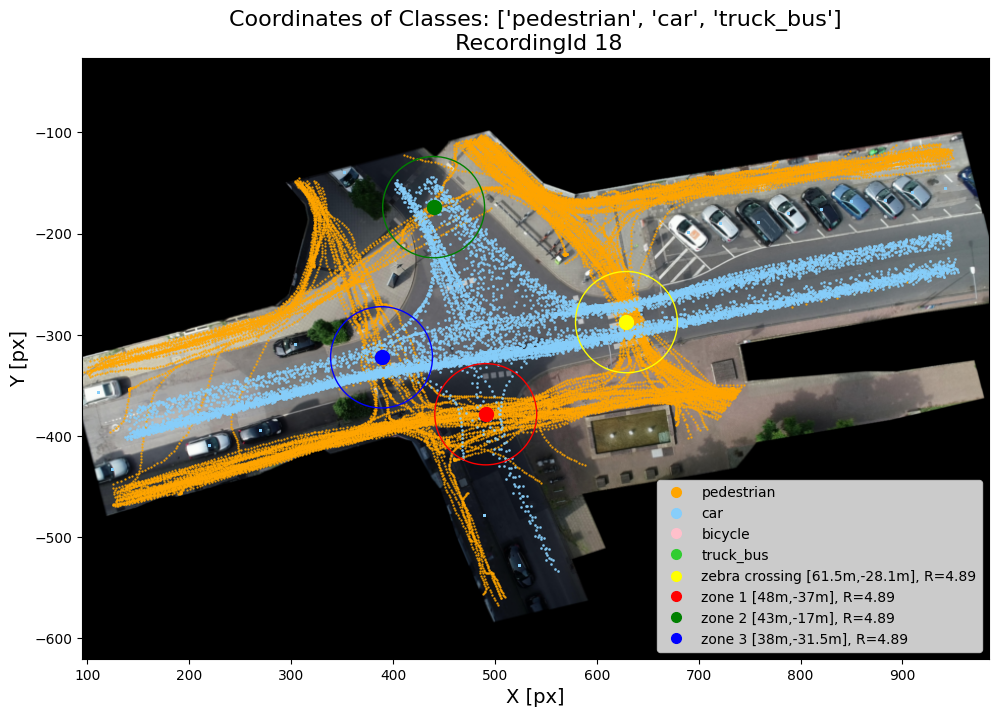

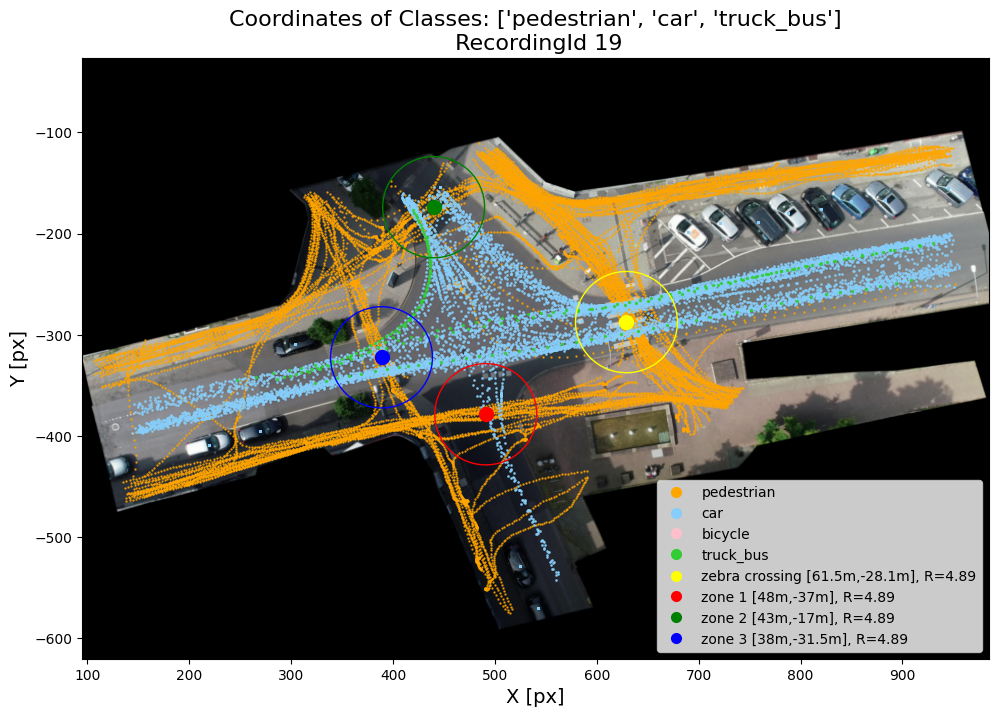

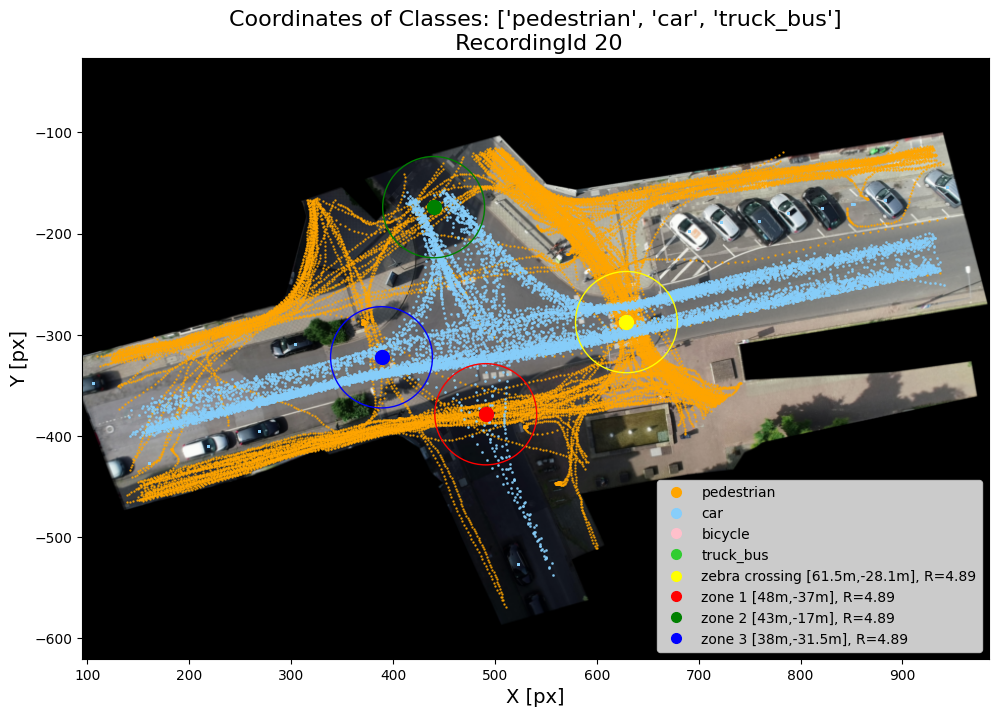

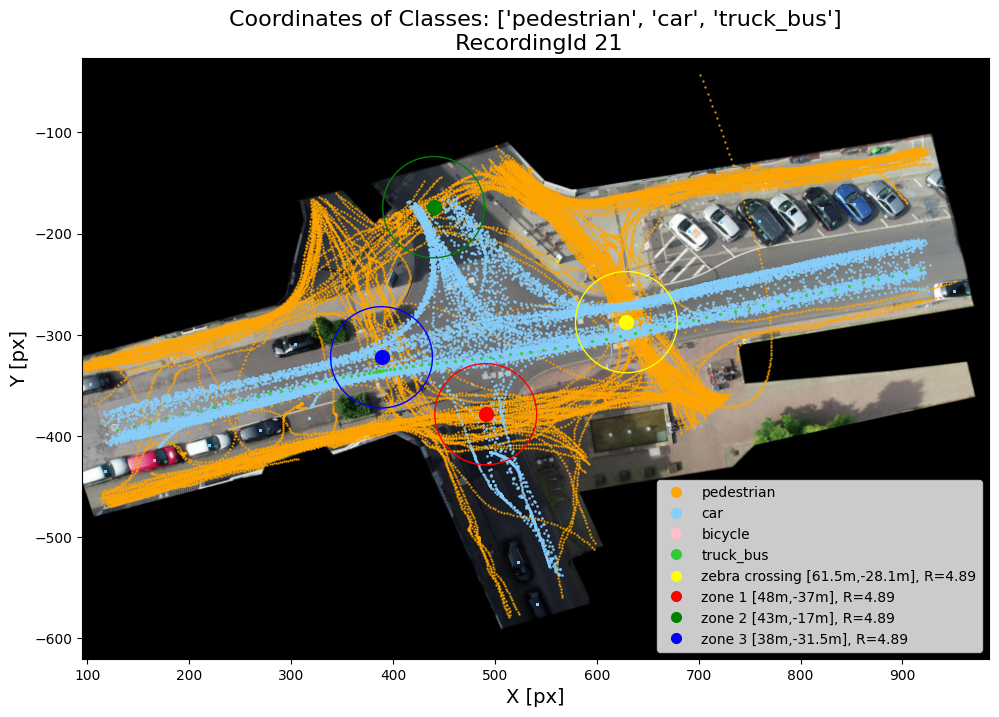

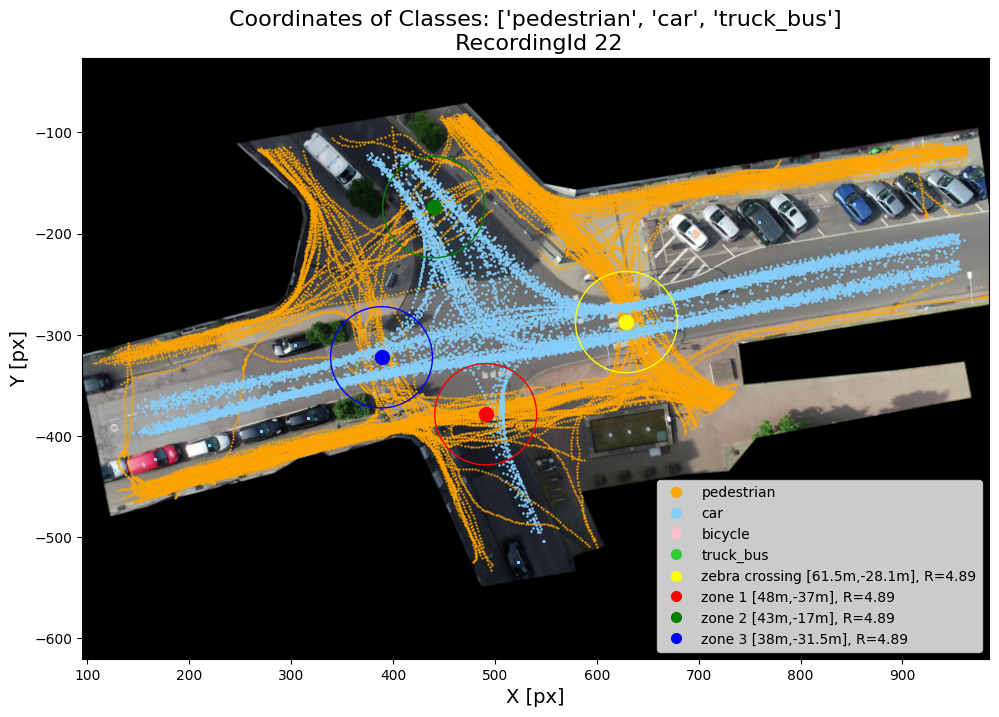

...

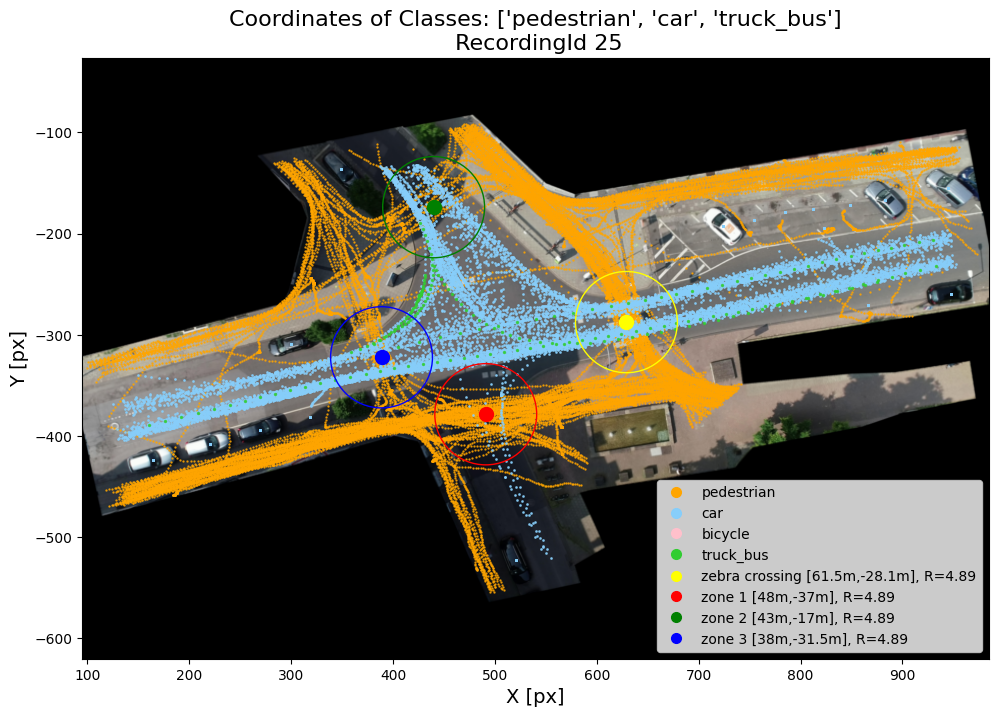

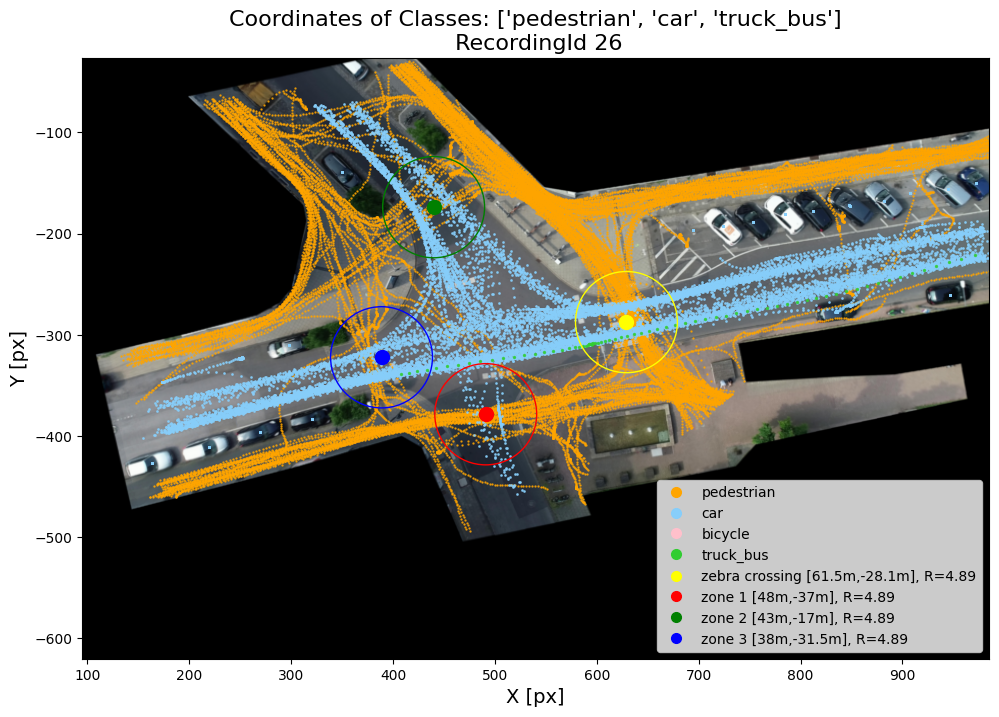

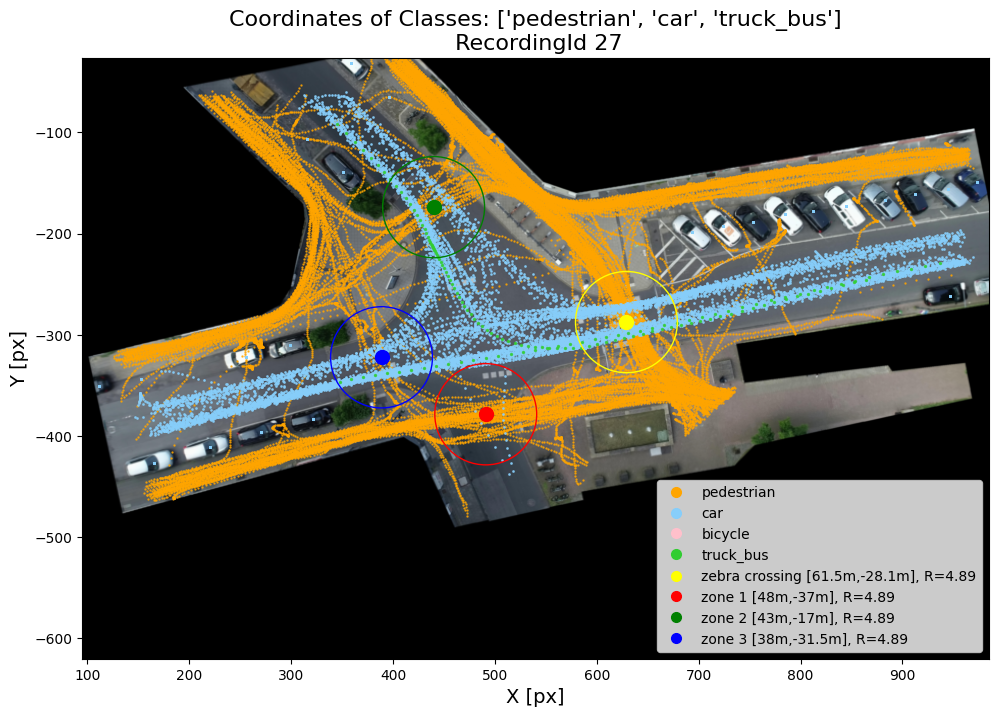

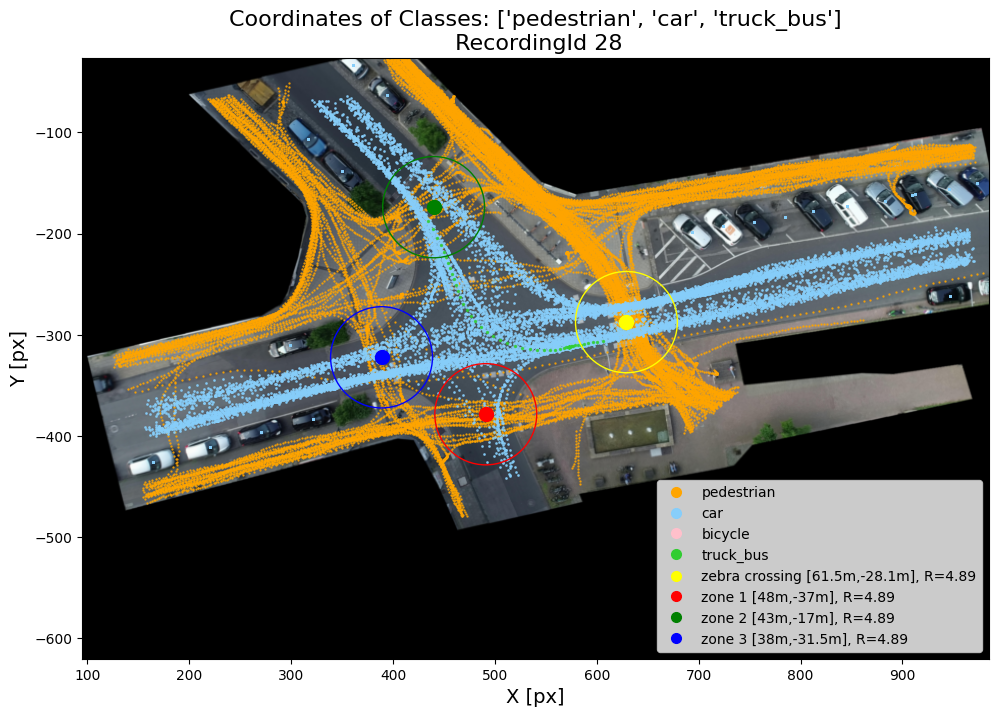

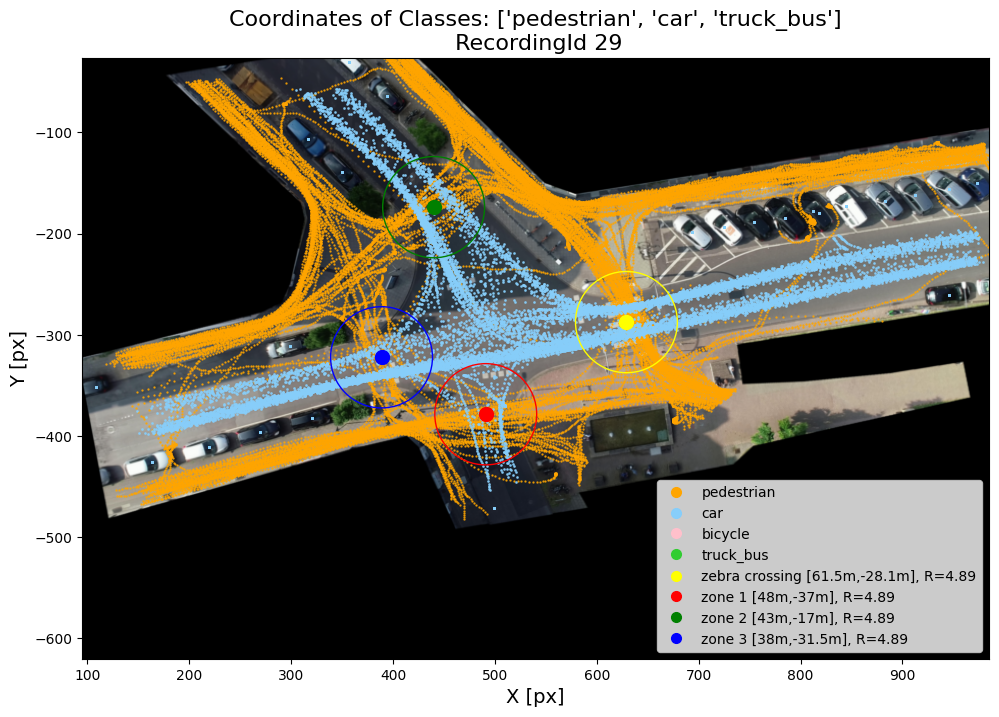

In [18]:
for x in range(len(dfs)):
# x=0
    background_image=imread(image_paths[x])
    plot_objects_on_aerial_image_with_circles(  dfs[x], background_image, orthoPxToMeter_list[x], 
                                                scale_down_factor, True, recordingId_list[x], active_classes,
                                                folder_name_ttc, xy_1,r1, xy_2,r2, xy_3,r3, r_zebra)

In [19]:
print(xy_1)
print(r1)
print(xy_2)
print(r2)
print(xy_3)
print(r3)
print(r_zebra)

[48, -37]
50
[43, -17]
50
[38, -31.5]
50
50


In [20]:
x=0
radius_1_m = convert_radius_to_meters(r1, orthoPxToMeter_list[x], scale_down_factor)
print(radius_1_m)

4.89


## check if a point is inside a circle perimeter

In [ ]:
# Example usage:
point = [0.3, 2]
center = [0, 0]
radius = radius_1_m
norm_dist = normalized_distance_from_center(point, center, radius) #point_xy_m, circle_center_xy_m, radius_m
print(norm_dist) 

0.413573587242468
